In [4]:
import h5py
import numpy as np
import pickle
from glob import glob
from PIL import Image
from IPython.display import display
from skimage import color
from skimage.metrics import structural_similarity as ssim
from itertools import product

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from tqdm import tqdm

In [44]:
def rescale(x,x_min=None,x_max=None):
    if x_min is None:
        x_min = x.min()
    if x_max is None:
        x_max = x.max()
    return (x - x_min)/(x_max - x_min)

def colour_histogram(x):
    r = np.histogram(x[:,:,0],255,[0,255])
    g = np.histogram(x[:,:,1],255,[0,255])
    b = np.histogram(x[:,:,2],255,[0,255])
    
    return r,g,b

def plot_colour_histograms(a,b=None,title=None):
    for h,c in zip(a,['red','green','blue']):
        plt.plot(h[1][:255],h[0]/h[0].sum(),color=c)
    if b is not None:
        for h,c in zip(b,['red','green','blue']):
            plt.plot(h[1][:255],-h[0]/h[0].sum(),color=c,linestyle='-.')
    plt.grid(False)
    if title is not None:
        plt.title(title)
    plt.show()

def display_images(a,b,r=4):
    compounded_image = np.concatenate([a,b],axis=1)
    compounded_image = compounded_image[::4,::4,:]
    display(Image.fromarray(compounded_image))

# Load images and process them

In [100]:

predictions_8 = {
    'Adden1':h5py.File('dataset/prediction_8-compiled_WBC_ADDEN_1.h5','r'),
    'MLL':h5py.File('dataset/prediction_8-compiled_WBC_MLL.h5','r'),
    'Adden2':h5py.File('dataset/prediction_8-compiled_WBC_ADDEN_2.h5','r')}

predictions_16 = {
    'Adden1':h5py.File('dataset/prediction_16-compiled_WBC_ADDEN_1.h5','r'),
    'MLL':h5py.File('dataset/prediction_16-compiled_WBC_MLL.h5','r'),
    'Adden2':h5py.File('dataset/prediction_16-compiled_WBC_ADDEN_2.h5','r')}

predictions_32 = {
    'Adden1':h5py.File('dataset/prediction_32-compiled_WBC_ADDEN_1.h5','r'),
    'MLL':h5py.File('dataset/prediction_32-compiled_WBC_MLL.h5','r'),
    'Adden2':h5py.File('dataset/prediction_32-compiled_WBC_ADDEN_2.h5','r')}

all_histograms = {}
all_lab = {}
all_ssim = {}
all_min_max = {}

In [101]:
for f in glob("stats/*"):
    n_features = f.split('_')[1].split('-')[0]
    dataset_name = '_'.join(f.split('-')[1].split('_')[2:])
    dataset_name = dataset_name[:-3]
    with open(f,'rb') as o:
        all_data = pickle.load(o)

    if n_features in all_histograms:
        all_histograms[n_features][dataset_name] = all_data['histograms']
        all_lab[n_features][dataset_name] = all_data['lab']
        all_ssim[n_features][dataset_name] = all_data['ssim']
    else:
        all_histograms[n_features] = {dataset_name:all_data['histograms']}
        all_lab[n_features] = {dataset_name:all_data['lab']}
        all_ssim[n_features] = {dataset_name:all_data['ssim']}

# Metrics

## Histogram distance (sum of squared errors)

The mapping appears to correctly transform images into more identical colour distributions. Particularly, the distance between histograms is minimised when all images are transformed.

In [102]:
histograms_for_plot = {}

for n in all_histograms:
    histograms_for_plot[n] = {}
    for k in all_histograms[n]:
        print(n,k)
        original = all_histograms[n][k]['original']
        prediction = all_histograms[n][k]['prediction']
        accumulator_original = {
            'r':np.zeros((all_histograms[n][k]['original'][0][0][0].size)),
            'g':np.zeros((all_histograms[n][k]['original'][0][0][0].size)),
            'b':np.zeros((all_histograms[n][k]['original'][0][0][0].size))}
        accumulator_prediction = {
            'r':np.zeros((all_histograms[n][k]['original'][0][0][0].size)),
            'g':np.zeros((all_histograms[n][k]['original'][0][0][0].size)),
            'b':np.zeros((all_histograms[n][k]['original'][0][0][0].size))}

        t = 0
        for a,b in zip(original,prediction):
            for i,c in enumerate(['r','g','b']):
                accumulator_original[c] += a[i][0]
                accumulator_prediction[c] += b[i][0][::-1]
            t += 1

        plotable_hist = [[],[]]
        for c in ['r','g','b']:
            accumulator_original[c] /= t
            accumulator_prediction[c] /= t

            accumulator_original[c] /= accumulator_original[c].sum()
            accumulator_prediction[c] /= accumulator_prediction[c].sum()

            plotable_hist[0].append(
                (accumulator_original[c],[i for i in range(0,256)]))
            plotable_hist[1].append(
                (accumulator_prediction[c],[i for i in range(0,256)]))

        histograms_for_plot[n][k] = plotable_hist

16 MLL
16 ADDEN_1
16 ADDEN_2
32 MLL
32 ADDEN_1
32 ADDEN_2
8 ADDEN_2
8 ADDEN_1
8 MLL


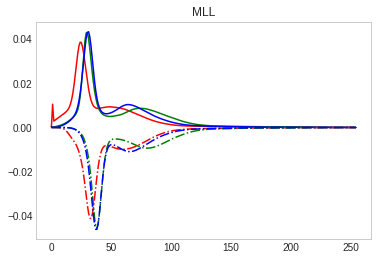

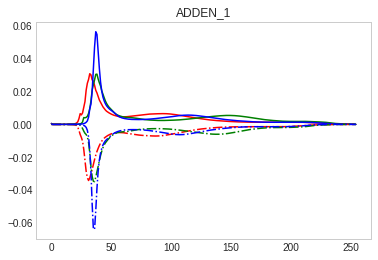

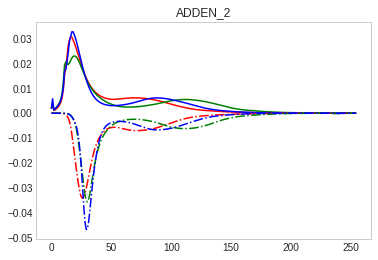

In [59]:
for k in histograms_for_plot['32']:
    a,b = histograms_for_plot['32'][k]
    plot_colour_histograms(a,b,k)

In [103]:
def histogram_distance(a,b):
    O = (a-b)**2 / (a+b)
    O = O[~np.isnan(O)]
    return np.sum(O)

def ssdh(a,b):
    return np.sum((a-b)**2)

all_keys = ['MLL','ADDEN_1','ADDEN_2']
ks = ['8','16','32']

distance_array = {k:np.zeros((3,3,2,2,3)) for k in ks}

for n in ks:
    all_combinations = product(
        product([0,1,2],[0,1]),
        product([0,1,2],[0,1]))

    for (k1,i1),(k2,i2) in all_combinations:
        for c in range(3):
            A = histograms_for_plot[n][all_keys[k1]][i1][c][0]
            B = histograms_for_plot[n][all_keys[k2]][i2][c][0]
            distance_array[n][k1,k2,i1,i2,c] = histogram_distance(A,B)

/hps/research/gerstung/josegcpa/projects/01IMAGE/tf2/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


In [104]:
for n in ks:
    print(distance_array[n].mean(0).mean(0).mean(-1))

[[0.39800921 1.48611335]
 [1.48611335 0.20206399]]
[[0.39612461 1.45975314]
 [1.45975314 0.35046672]]
[[0.3965153  1.48682051]
 [1.48682051 0.22615061]]


## Structural similarity

Ideally, this should be close to 1 for all cohorts. As observable, this checks out.

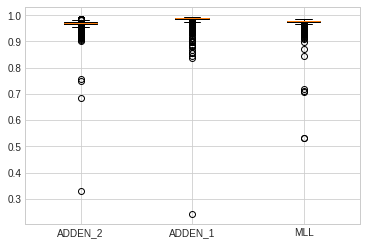

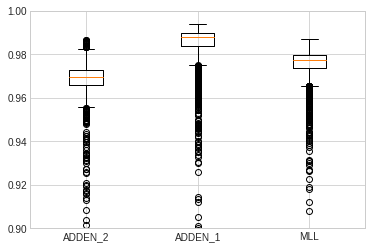

In [107]:
n = '8'
fig = plt.figure()
ax = fig.add_subplot(111)
bp = plt.boxplot(
    [all_ssim[n][k] for k in all_ssim[n]])

ax.set_xticklabels([k for k in all_ssim[n]])

fig = plt.figure()
ax = fig.add_subplot(111)
bp = plt.boxplot(
    [all_ssim[n][k] for k in all_ssim[n]])

ax.set_xticklabels([k for k in all_ssim[n]])

ax.set_ylim([0.9,1])

plt.show()

MLL


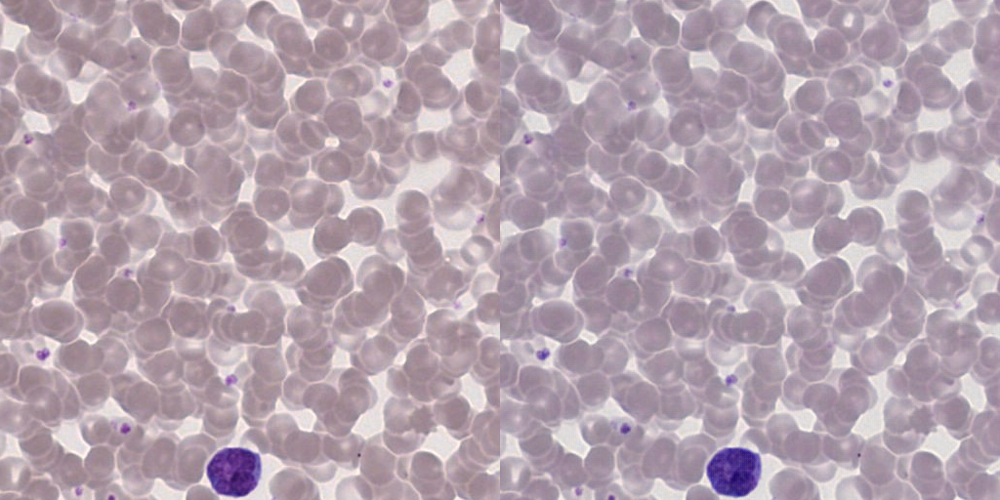

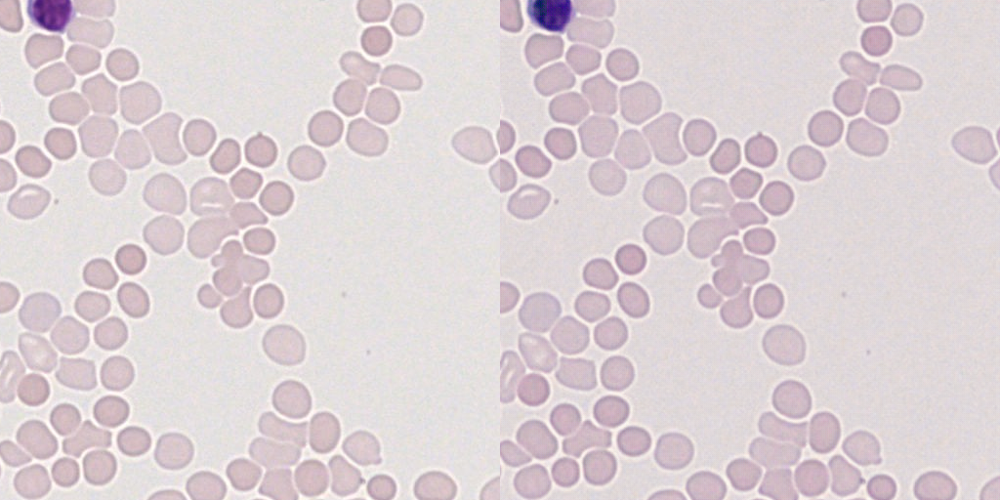

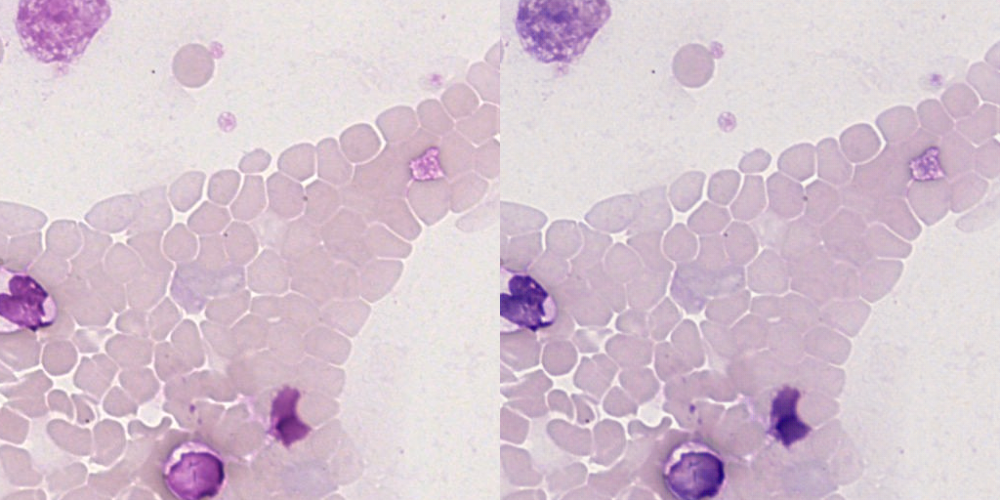

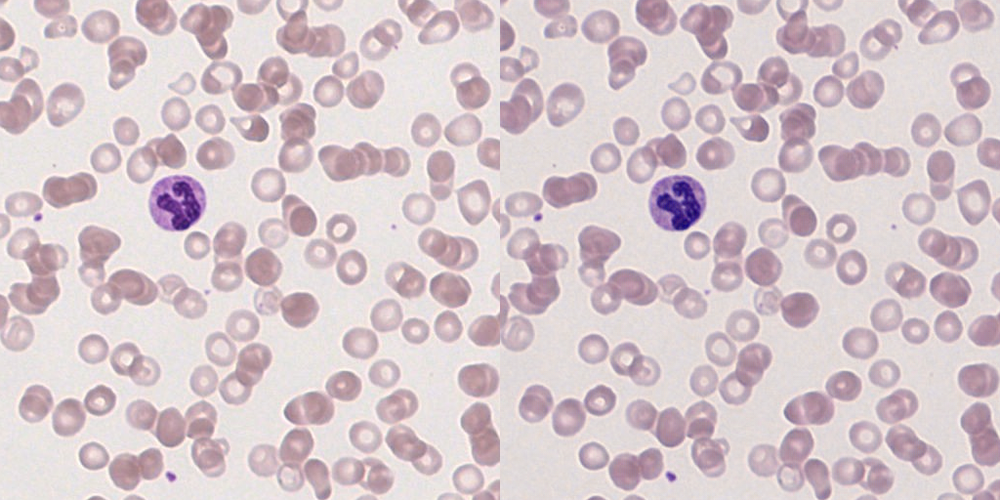

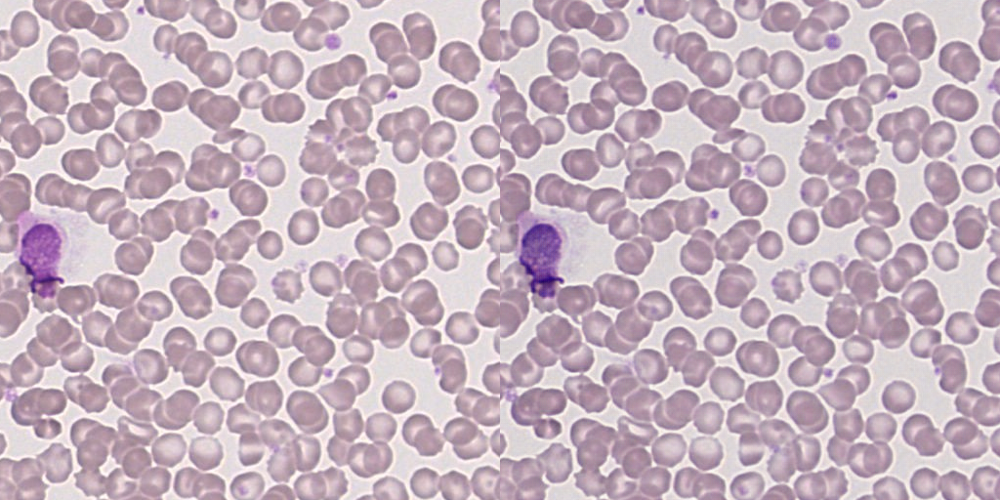

...

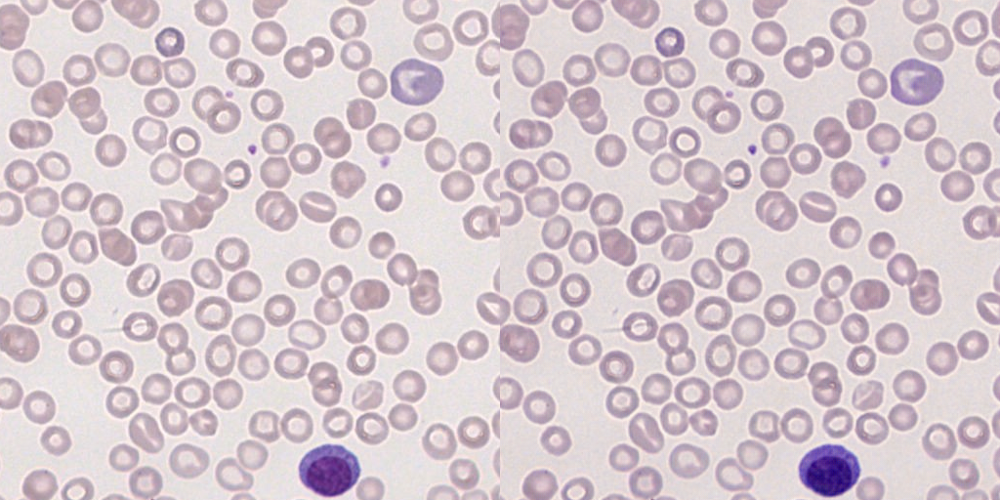

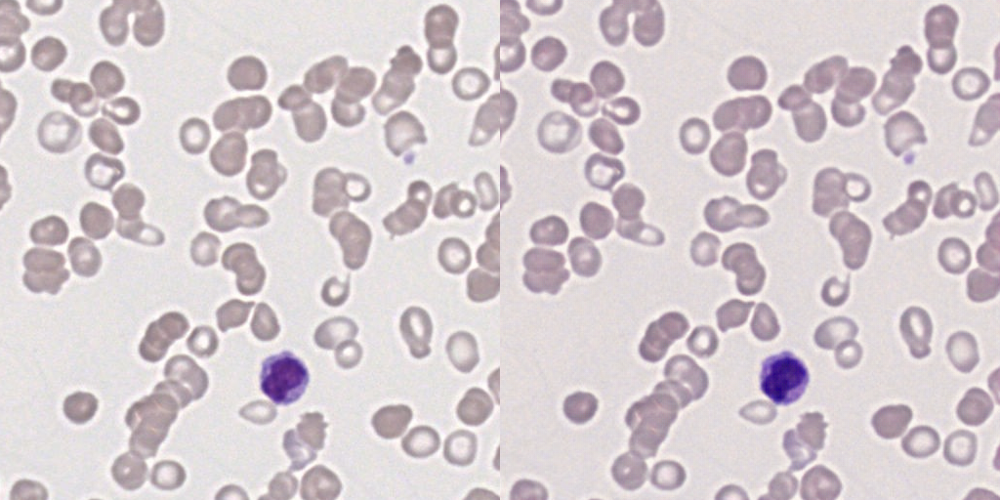

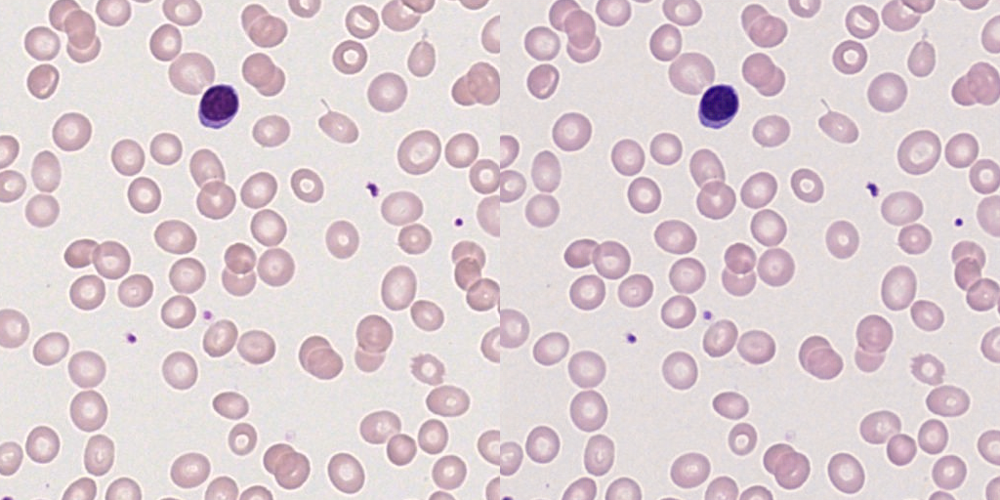

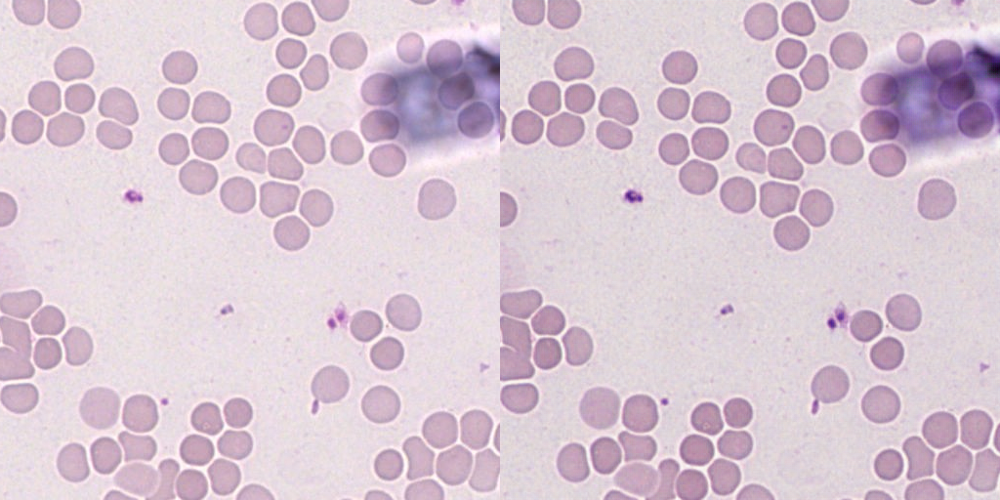

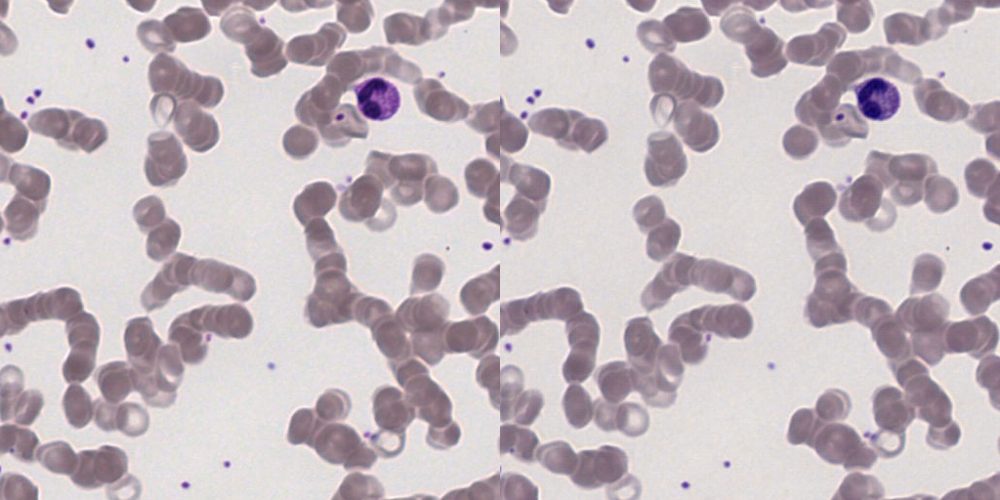

KeyboardInterrupt: 

In [92]:
h,w = 512,1024
r = 1
border = 8

n_tiles = [12,12]

big_image = np.zeros(
    (n_tiles[0] * (h // r + border*2),n_tiles[1] * (w // r + border*2),3),
    dtype=np.uint8)

for curr_dataset in ['MLL','Adden1','Adden2']:#predictions:
    all_keys = list(predictions_8[curr_dataset].keys())
    all_keys = np.random.choice(all_keys,n_tiles[0]*n_tiles[1],
                                replace=False)
    print(curr_dataset)
    for i,key in enumerate(all_keys):
        image = predictions_8[curr_dataset][key]['image'][()]
        prediction = rescale(predictions_8[curr_dataset][key]['prediction'][()])

        image = np.uint8(image)
        prediction = np.uint8(prediction * 255)
        
        compounded_image = np.concatenate([image,prediction],axis=1)[::r,::r]
        
        a,b = i // n_tiles[0],i % n_tiles[1]
        a *= h//r + border * 2
        b *= w//r + border * 2
        A,B,C,D = a+border,a+h//r+border,b+border,b+w//r+border
        display(Image.fromarray(compounded_image))